In [50]:
import os
import pandas as pd
import numpy as np
import quiche as qu
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import seaborn as sns

%reload_ext autoreload
%load_ext autoreload
%autoreload 2
%matplotlib inline

sc.set_figure_params(dpi = 400, dpi_save = 400, fontsize = 14)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Download data

In [ ]:
qu.pp.download_data(id = 'spain_preprocessed', overwrite = True)

### Load in data

In [2]:
# adata = anndata.read_h5ad(os.path.join('data', 'spain_preprocessed.h5ad'))

adata = anndata.read_h5ad('/Users/jolene/Documents/Angelo_lab/untracked_quiche/data/spain_preprocessed.h5ad')

## Ensure outcome variable for differential testing is encoded as a string
adata.obs['Relapse'] = adata.obs['Relapse'].astype('int').astype('str')
adata.obs['Study'] = adata.obs['Study'].map(dict(zip(adata.obs['Study'].cat.categories,['A', 'B', 'C', 'D', 'E'])))

## Ensure you're data is properly normalized. Standardization here is to look at functional expression differences
adata.raw = adata
adata.X = qu.pp.standardize(adata.X)

## Removes FOVs that are less than the downsampling (i.e. sketch) size
sketch_size = 1000
adata  = qu.pp.filter_fovs(adata, 'Patient_ID', sketch_size)

### Perform differential spatial enrichment analysis with QUICHE

In [3]:
### initialize class
quiche_op = qu.tl.QUICHE(adata = adata, labels_key = 'cell_cluster', spatial_key = 'spatial', fov_key = 'fov', patient_key = 'Patient_ID', segmentation_label_key = 'label')
### step 1: compute spatial niches
## in this case we are computing a knn of 30 neighbors bounded by 200 pixel radius
quiche_op.compute_spatial_niches(radius = 200, n_neighbors = 30, min_cell_threshold = 3)
### step 2: perform distribution-focused downsampling by sampling niches from each patient according to the sketch size parameter
quiche_op.subsample(sketch_size = sketch_size, sketch_key = 'Patient_ID', n_jobs = 8)
### step 3: test for differential spatial enrichment across conditions. 
## in this case, we are testing for differential enrichment across relapse groups while adjusting for medical center (i.e. study)
## for more details on model contrasts, see edgeR documentation
quiche_op.differential_enrichment(design = '~Study+Relapse', model_contrasts = 'Relapse1', k_sim = 100)
### step 4: annotate niche neighborhoods by the most abundant cell types
## in this case, annotate subsampled niche neighborhoods by the top 3 and predict the out of sample niche neighborhoods
## if you only want the subsampled annotations, set extrapolate = False to save on runtime!!!
quiche_op.annotate_niches(nlargest = 3, annotation_key = 'quiche_niche_neighborhood', extrapolate = True, k_sim = 100, n_jobs = 8)

INFO:quiche.tools.quiche:Converted .obsm[spatial] to numpy array.
INFO:quiche.tools.quiche:Converted 'fov' to categorical.
INFO:quiche.tools.quiche:Computing spatial niches...
INFO:quiche.tools.quiche:Performing distribution-focused downsampling...
Performing subsampling:   0%|          | 0/296 [00:00<?, ?it/s]

  0%|          | 0/296 [00:00<?, ?it/s]

INFO:quiche.tools.quiche:Downsampled niches to 296000 total subsamples.
INFO:quiche.tools.quiche:Testing for differential spatial enrichment across conditions...
Performing subsampling:   0%|          | 0/296 [08:52<?, ?it/s]
INFO:quiche.tools.quiche:Annotating niche neighborhoods...
Labeling Niches: 100%|██████████| 296000/296000 [00:09<00:00, 32356.00it/s]
INFO:quiche.tools.quiche:Predicting out of sample niche neighborhoods. Will take some time...


### Access significant niche neighborhoods

In [4]:
## aggregates and returns 'significant' annotated niche neighborhoods
## in this case, we are filtering to ensure niches have median logFC > 1 or < -1 and have median Spatial FDR < 0.05
## feel free to intially relax your thresholds when examining results to ensure you're not missing information based on too strict of cutoffs
niche_scores = qu.tl.filter_niches(quiche_op,
                                   thresholds = {'logFC': {'median' : [-1, 1]}, 'SpatialFDR': {'median' : 0.05}},
                                   min_niche_count = 5,
                                   annotation_key = 'quiche_niche_neighborhood')

niche_scores.sort_values(by = 'logFC').head()

,logFC,SpatialFDR
quiche_niche_neighborhood,,
CD163_Mac__CD8T__Cancer_3,-1.657132,5.137915e-08
CD163_Mac__CD4T__Cancer_3,-1.545802,1.653479e-08
CD163_Mac,-1.510463,2.506346e-06
CD163_Mac__CD68_Mac__Monocyte,-1.504911,1.320896e-05
CAF__Cancer_3,-1.410343,1.731744e-07


In [5]:
## computes summary statistics
niche_metadata = qu.tl.compute_niche_metadata(quiche_op,
                                            niches = list(niche_scores.index),
                                            annotation_key = 'quiche_niche_neighborhood',
                                            patient_key = 'Patient_ID',
                                            condition_key = 'Relapse',
                                            niche_threshold = 0,
                                            condition_type  = 'binary',
                                            metrics = ['logFC', 'SpatialFDR', 'PValue'])

niche_metadata.head()

,quiche_niche_neighborhood,Relapse,n_patients_niche,patient_ids,med_logFC,mean_logFC,med_SpatialFDR,mean_SpatialFDR,med_PValue,mean_PValue,mean_niche_abundance,n_patients_condition,proportion_patients_niche
0,APC__CD8T__Smooth_Muscle,0,8,"[22.0, 193.0, 200.0, 204.0, 207.0, 274.0, 337....",-1.030349,-0.965290,0.000635,0.020080,4.487536e-05,0.006917,2.000000,194,0.041237
1,APC__CD8T__Smooth_Muscle,1,3,"[245.0, 249.0, 174045.0]",-1.030349,-0.965290,0.000635,0.020080,4.487536e-05,0.006917,1.333333,102,0.029412
2,APC__Cancer_1__Neutrophil,1,1,[286.0],1.148788,1.151874,0.000002,0.003036,3.909658e-08,0.000467,9.000000,102,0.009804
3,APC__Cancer_3,0,18,"[24.0, 56.0, 88.0, 155.0, 157.0, 158.0, 164.0,...",-1.228748,-1.200267,0.000019,0.012072,6.363874e-07,0.007424,12.611111,194,0.092784
4,APC__Cancer_3,1,2,"[237.0, 378.0]",-1.228748,-1.200267,0.000019,0.012072,6.363874e-07,0.007424,5.500000,102,0.019608


### Visualize all cell types in significant niches of interest

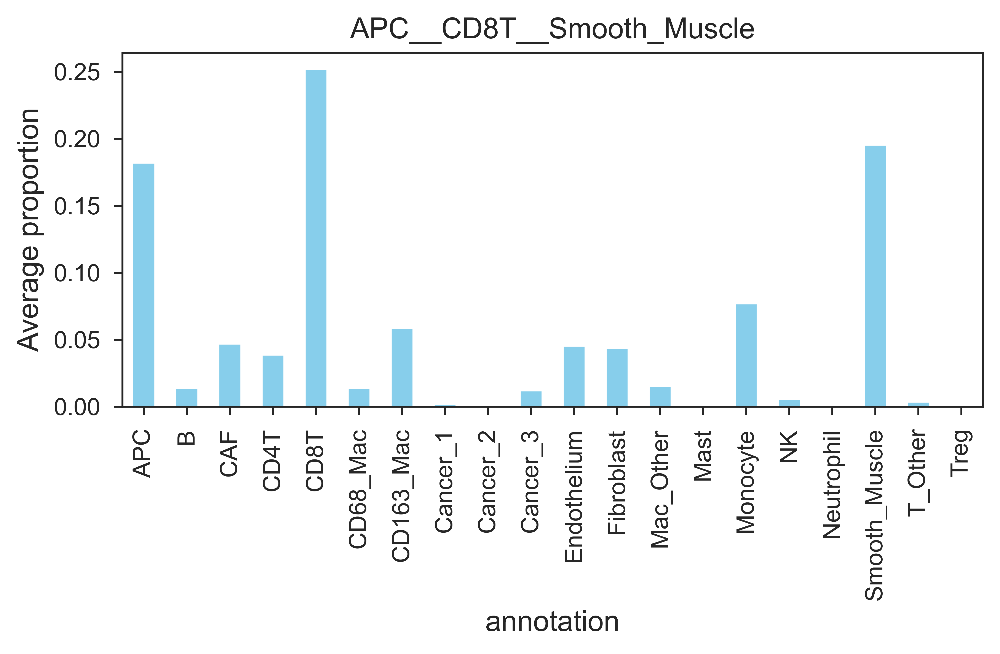

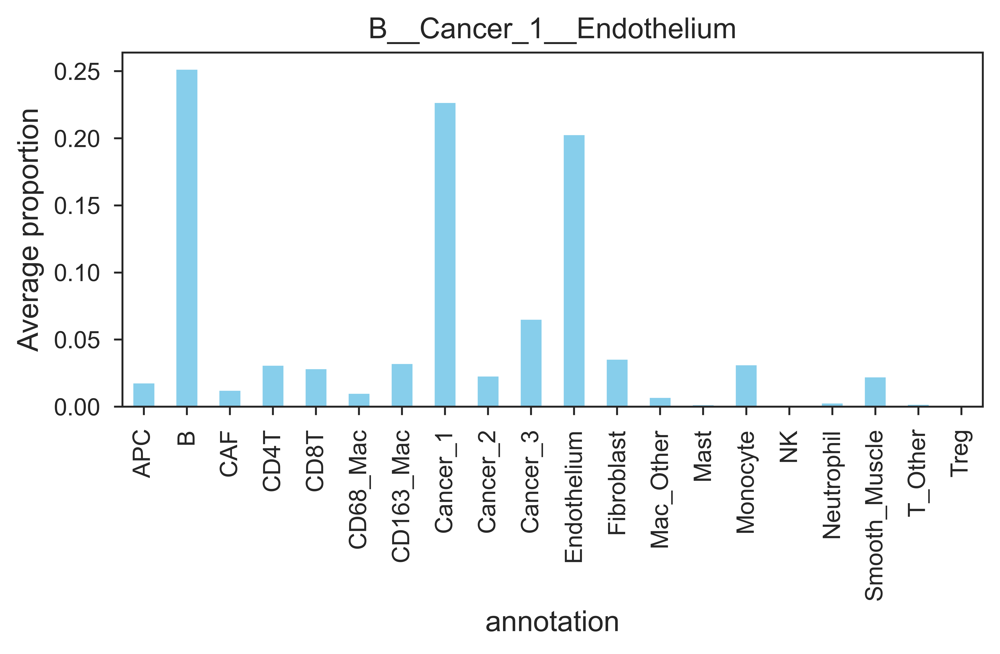

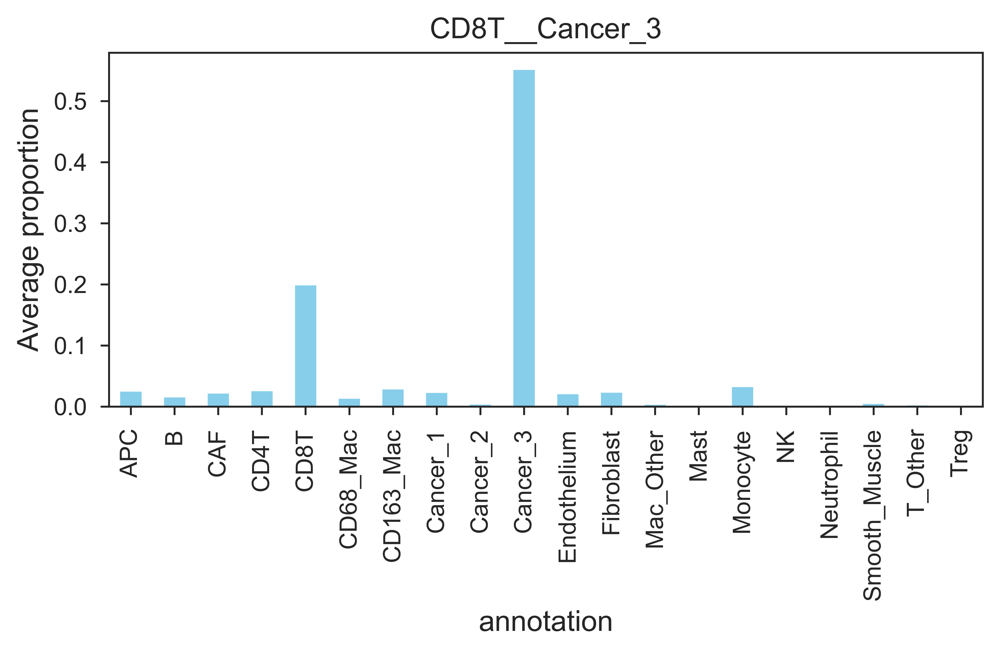

In [51]:
annotation_key = 'quiche_niche_neighborhood'
sns.set_style('ticks')
df_prop = quiche_op.adata_niche.to_df()
df_prop.loc[:, annotation_key] =  quiche_op.adata_niche.obs[annotation_key].values
average_proportions = df_prop.groupby(annotation_key).mean()

niche_list = ['APC__CD8T__Smooth_Muscle', 'B__Cancer_1__Endothelium', 'CD8T__Cancer_3']
for niche in niche_list:
    plt.figure(figsize=(6, 4))
    average_proportions.loc[niche].plot(kind='bar', color='skyblue')
    
    plt.title(f'{niche}', fontsize = 12)
    plt.xlabel('annotation', fontsize = 12)
    plt.ylabel('Average proportion', fontsize = 12)
    plt.xticks(rotation=90)
    plt.tick_params(labelsize=10)
    plt.tight_layout()
    
    plt.show()

### Plot significant niche neighborhoods

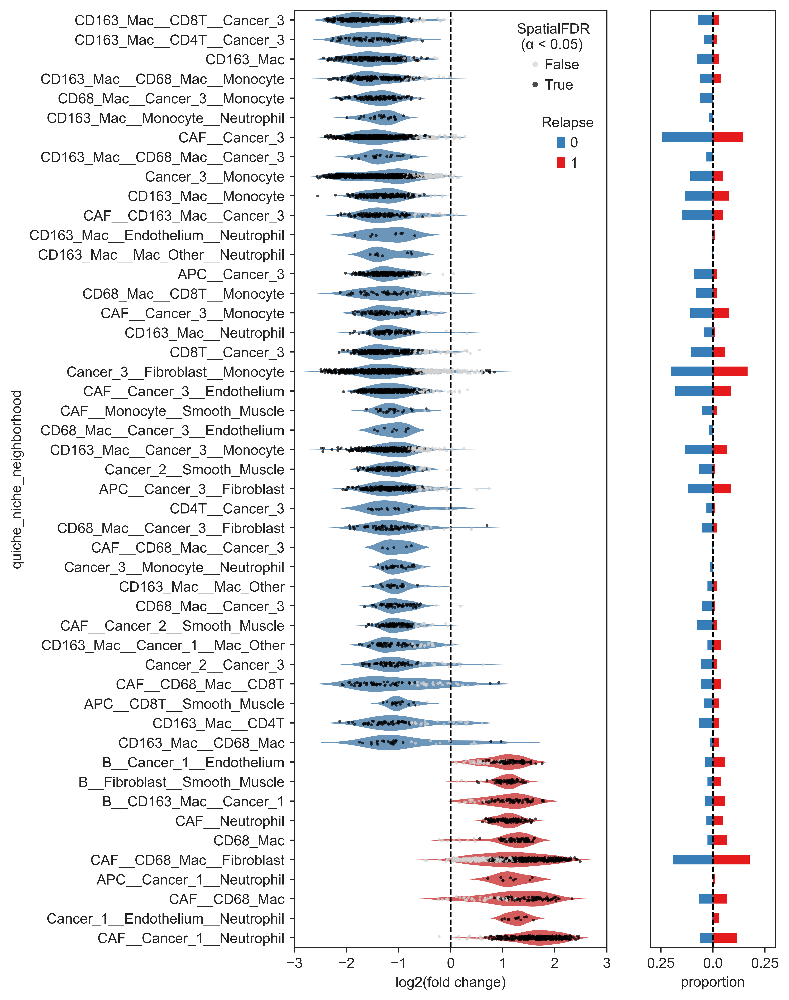

In [ ]:
qu.pl.beeswarm_proportion(quiche_op,
                niche_metadata = niche_metadata,
                niches = niche_scores.index,
                xlim = [-3,3],
                xlim_proportion = [-0.3, 0.3],
                logfc_key = 'logFC',
                pvalue_key = 'SpatialFDR',
                annotation_key = 'quiche_niche_neighborhood',
                condition_key = 'Relapse',
                figsize = (6, 12),
                fontsize = 10,
                colors_dict = {'0': '#377eb8', '1': '#e41a1c'},
                save_directory = None,
                filename_save = None)

### Plot niche network diagrams

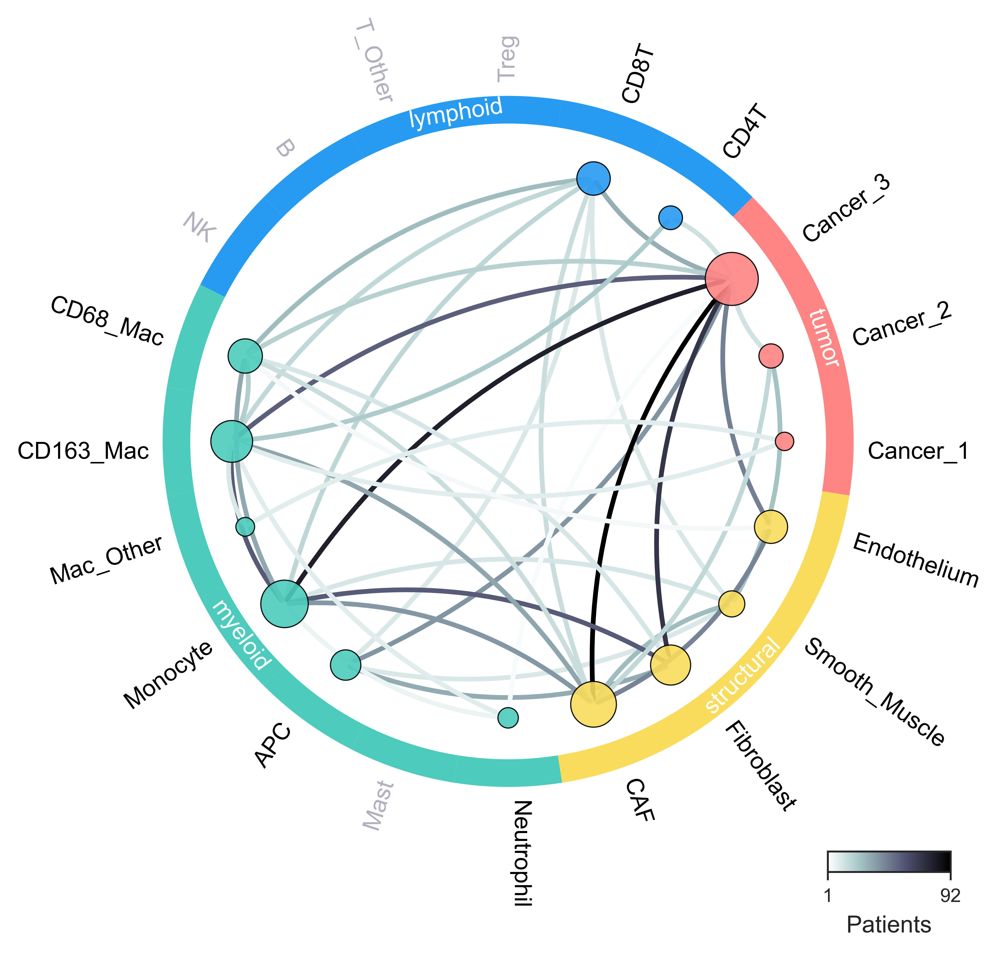

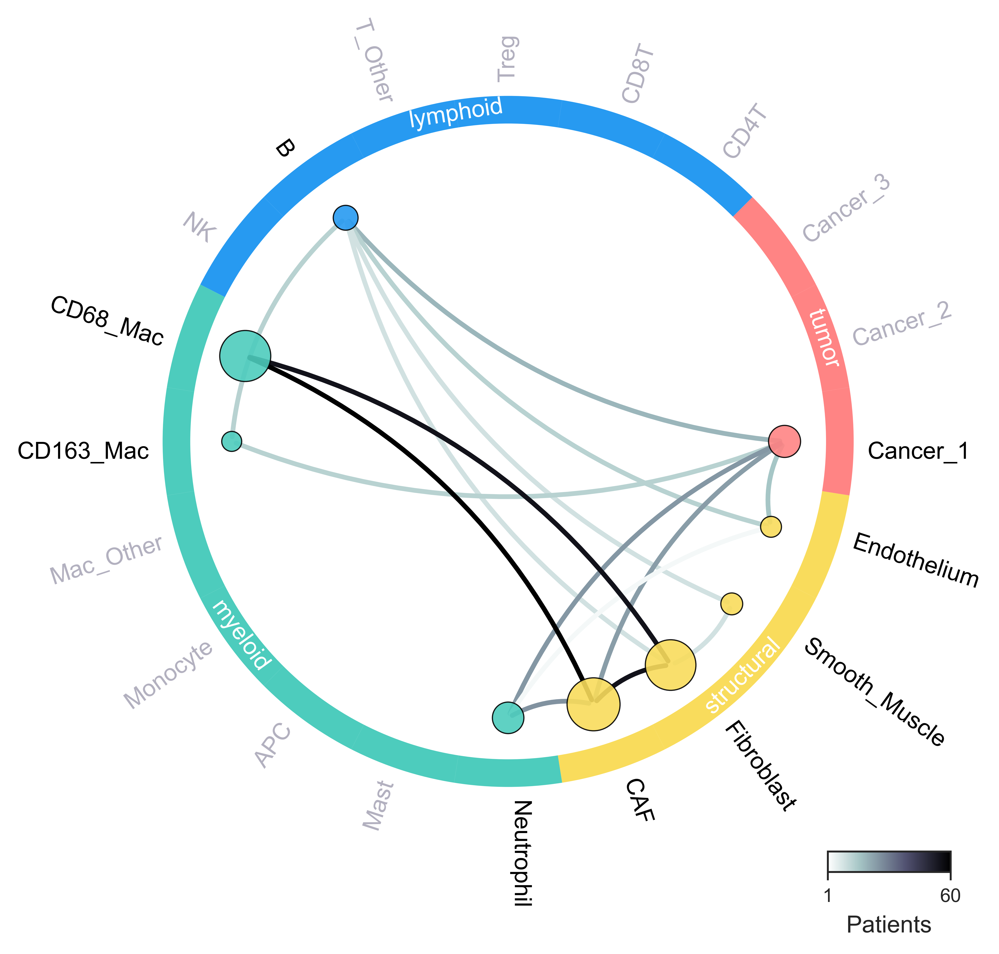

In [7]:
colors_dict = {'myeloid':'#4DCCBD', 'lymphoid':'#279AF1', 'tumor':'#FF8484', 'structural':'#F9DC5C'}

lineage_dict = {'APC':'myeloid', 'B':'lymphoid', 'CAF': 'structural', 'CD4T': 'lymphoid', 'CD8T': 'lymphoid',
                'CD68_Mac': 'myeloid', 'CD163_Mac': 'myeloid', 'Cancer_1': 'tumor', 'Cancer_2': 'tumor', 'Cancer_3': 'tumor',
                'Endothelium':'structural', 'Fibroblast': 'structural', 'Mac_Other': 'myeloid', 'Mast':'myeloid', 'Monocyte':'myeloid',
                'NK':'lymphoid', 'Neutrophil':'myeloid', 'Smooth_Muscle':'structural', 'T_Other':'lymphoid', 'Treg':'lymphoid'}

cell_ordering = ['Cancer_1', 'Cancer_2', 'Cancer_3', 'CD4T', 'CD8T', 'Treg', 'T_Other', 'B', 
                 'NK', 'CD68_Mac', 'CD163_Mac', 'Mac_Other', 'Monocyte', 'APC','Mast', 'Neutrophil',
                 'CAF', 'Fibroblast', 'Smooth_Muscle', 'Endothelium']

##niche network for patients that did not relapse, ie logFC < 0
niche_metadata_neg = niche_metadata[(niche_metadata['mean_logFC'] < 0) & (niche_metadata['n_patients_niche'] > 1)]
G1 = qu.tl.compute_niche_network(niche_df = niche_metadata_neg,
                          colors_dict = colors_dict,
                          lineage_dict = lineage_dict,
                          annotation_key = 'quiche_niche_neighborhood')

qu.pl.plot_niche_network_donut(G = G1,
                               figsize=(6, 6),
                               node_order = cell_ordering,
                               centrality_measure = 'eigenvector',
                               colors_dict = colors_dict,
                               lineage_dict=lineage_dict, 
                               donut_radius_inner = 1.15,
                               donut_radius_outer = 1.25,
                               edge_cmap = 'bone_r',
                               edge_label = 'Patients',
                               save_directory=None,
                               filename_save=None)

##niche network for patients that relapsed, ie logFC > 0
niche_metadata_pos = niche_metadata[(niche_metadata['mean_logFC'] > 0) & (niche_metadata['n_patients_niche'] > 1)]
G2 = qu.tl.compute_niche_network(niche_df = niche_metadata_pos,
                          colors_dict = colors_dict,
                          lineage_dict = lineage_dict,
                          annotation_key = 'quiche_niche_neighborhood')

qu.pl.plot_niche_network_donut(G = G2,
                               figsize=(6, 6),
                               node_order = cell_ordering,
                               centrality_measure = 'eigenvector',
                               colors_dict = colors_dict,
                               lineage_dict=lineage_dict, 
                               donut_radius_inner = 1.15,
                               donut_radius_outer = 1.25,
                               edge_cmap = 'bone_r',
                               edge_label = 'Patients',
                               save_directory=None,
                               filename_save=None)

### Map niche neighborhoods back to FOV for visualization

* Plot niche neighborhoods

Plotting niches:   0%|          | 0/1 [00:00<?, ?FOVs/s]

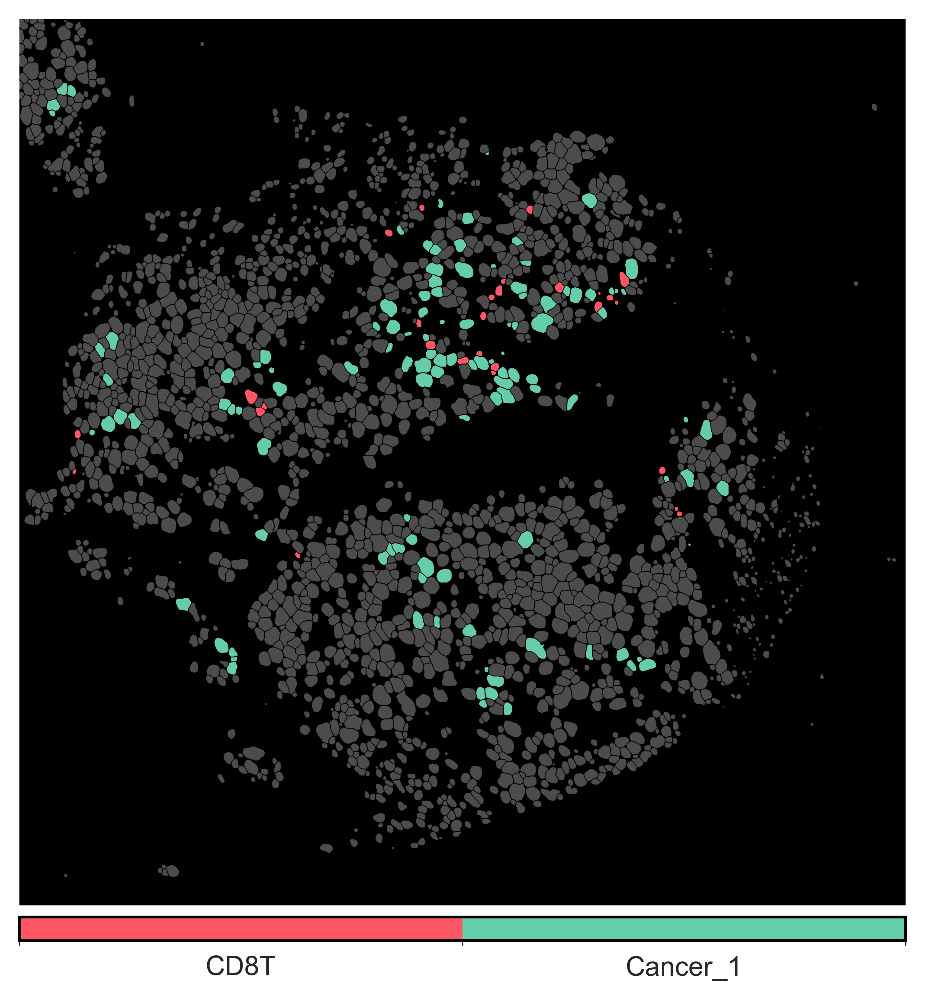

In [8]:
niche = 'CD8T__Cancer_1'
seg_dir = r'/Volumes/Shared/Noah Greenwald/TNBC_Cohorts/SPAIN/segmentation/samples/deepcell_output'

qu.pl.plot_niches(quiche_op, 
                  niche = niche,
                  fovs = ['TMA44_R14C7'],
                  segmentation_directory = seg_dir,
                  save_directory = os.path.join('figures', 'quiche_niche_neighborhood'),
                  fov_key = "fov",
                  segmentation_label_key  = "label",
                  labels_key='cell_cluster',
                  annotation_key = "quiche_niche_neighborhood",
                  seg_suffix = "_whole_cell.tiff",
                  colors_dict = {'Cancer_1': '#66cdaa', 'CD8T': '#ff5666'},
                  figsize = (6, 6),
                  dpi = 300)

* Plot niche scores (e.g. logFC, -log10(SpatialFDR))

Plotting niche scores:   0%|          | 0/1 [00:00<?, ?FOVs/s]

Plotting niche scores:   0%|          | 0/1 [00:00<?, ?FOVs/s]

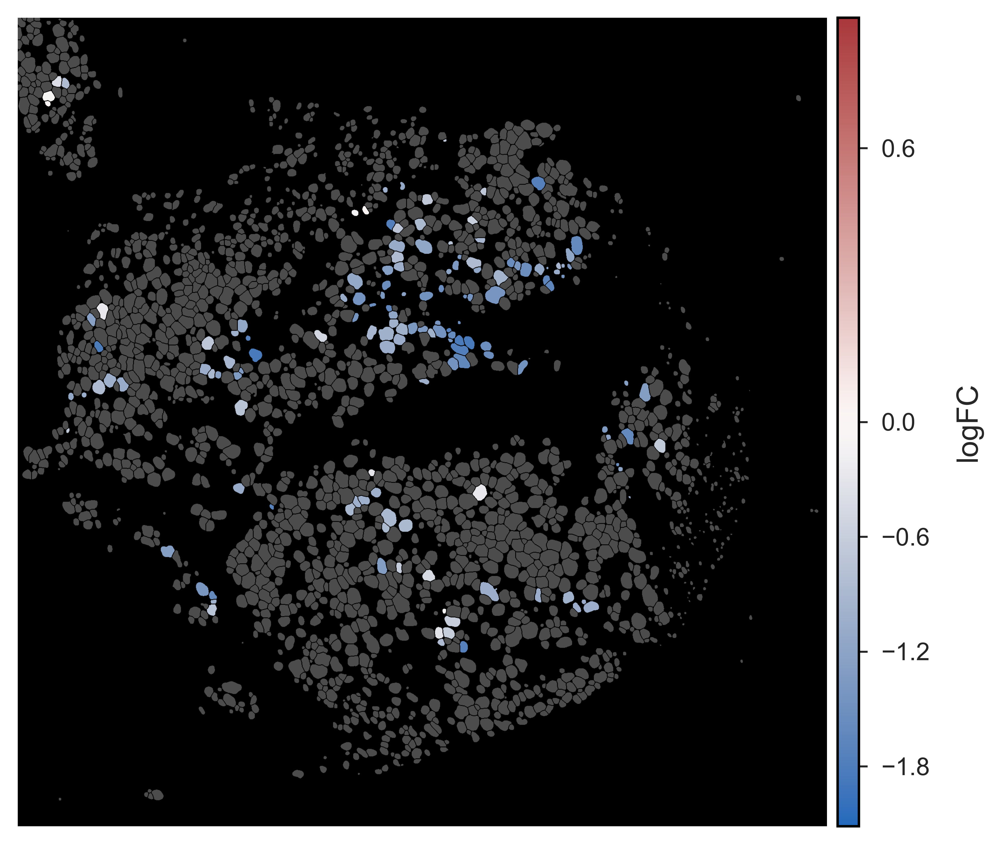

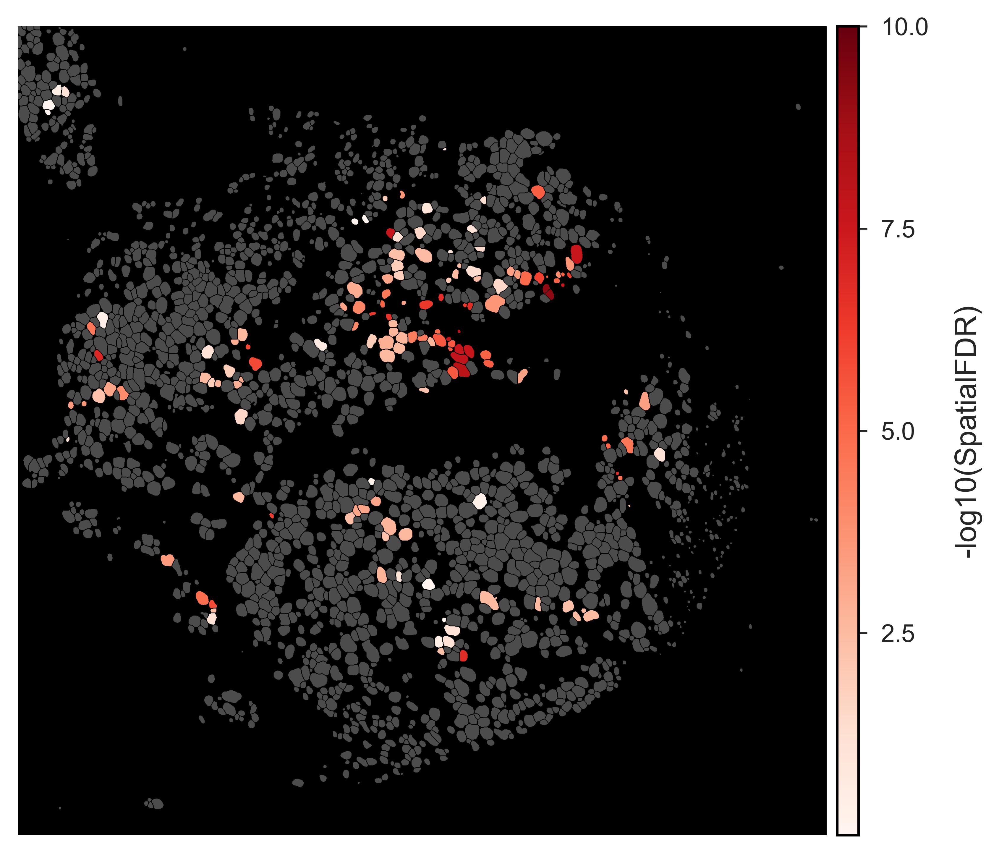

In [9]:
qu.pl.plot_niche_scores(quiche_op, 
                        niche = niche,
                        fovs = ['TMA44_R14C7'],
                        segmentation_directory = seg_dir,
                        save_directory = os.path.join('figures', 'logFC'),
                        fov_key = "fov",
                        segmentation_label_key  = "label",
                        labels_key='cell_cluster',
                        annotation_key = "quiche_niche_neighborhood",
                        metric = "logFC",
                        seg_suffix = "_whole_cell.tiff",
                        vmin  = None,
                        vmax = None,
                        vcenter = 0,
                        cmap = "vlag",
                        figsize = (6, 6),
                        dpi = 300)

qu.pl.plot_niche_scores(quiche_op, 
                        niche = niche,
                        fovs = ['TMA44_R14C7'],
                        segmentation_directory = seg_dir,
                        save_directory = os.path.join('figures', '-log10(SpatialFDR)'),
                        fov_key = "fov",
                        segmentation_label_key  = "label",
                        labels_key='cell_cluster',
                        annotation_key = "quiche_niche_neighborhood",
                        metric = "-log10(SpatialFDR)",
                        seg_suffix = "_whole_cell.tiff",
                        vmin  = None,
                        vmax = None,
                        cmap = "Reds",
                        figsize = (6, 6),
                        dpi = 300)

### plot out of sample niche neighborhoods

* If you used `annotate_niches(extrapolate = True)` to predict annotations for cells outside the subsample using a knn classifier, you can visualize niche annotations and predicted probabilities for *all* cells as follows. 

* **Of note**, this will help make the visualizations less sparse, but interpret them with the recall and confidence scores in mind. Predicted labels are less accurate than the original subsampled annotations.

In [54]:
results = qu.tl.compute_recall_metrics(quiche_op, niche_scores, n_largest = 3, annotation_key = 'quiche_niche_neighborhood', extrapolated_key =  'quiche_niche_neighborhood_extrapolated')
results.head()

,niche,top_recall,avg_quiche_niche_neighborhood_extrapolated_probability,top,size,significant,n_largest
0,APC,1.0,0.347103,"APC, Monocyte, Fibroblast",50,0,3
1,APC__B__CAF,1.0,0.117143,"B, APC, CAF",17,0,3
2,APC__B__CD163_Mac,1.0,0.213966,"B, APC, CD163_Mac",28,0,3
3,APC__B__CD4T,1.0,0.395986,"B, APC, CD4T",132,0,3
4,APC__B__CD8T,1.0,0.336151,"APC, B, CD8T",150,0,3


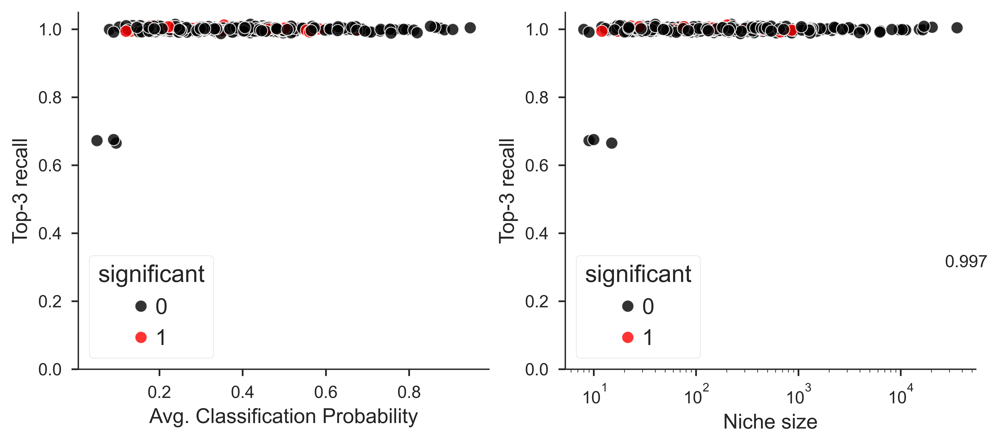

In [ ]:
# as QC, plot out of sample recall
qu.pl.plot_recall(results, n_largest = 3, extrapolated_key = 'quiche_niche_neighborhood_extrapolated', seed = 42, save_directory = 'figures', filename_save = f'extrapolated_recall')

Plotting niches:   0%|          | 0/1 [00:00<?, ?FOVs/s]

Plotting niche scores:   0%|          | 0/1 [00:00<?, ?FOVs/s]

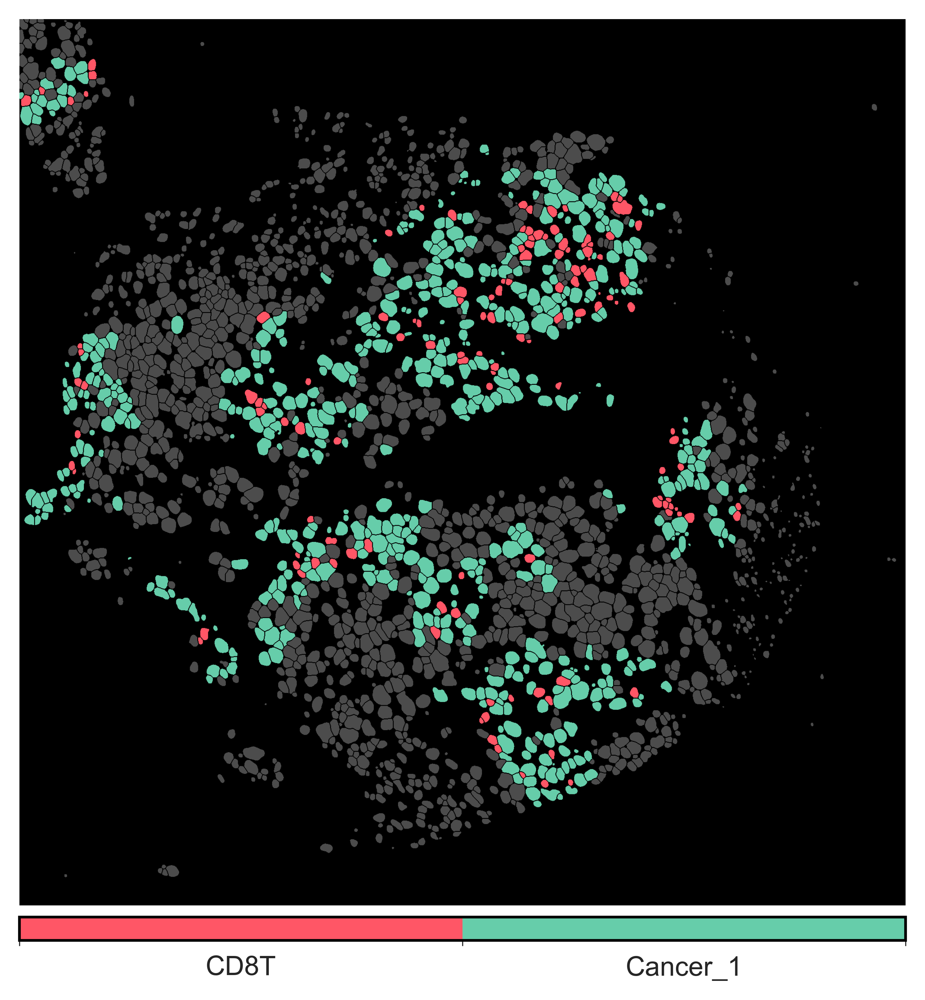

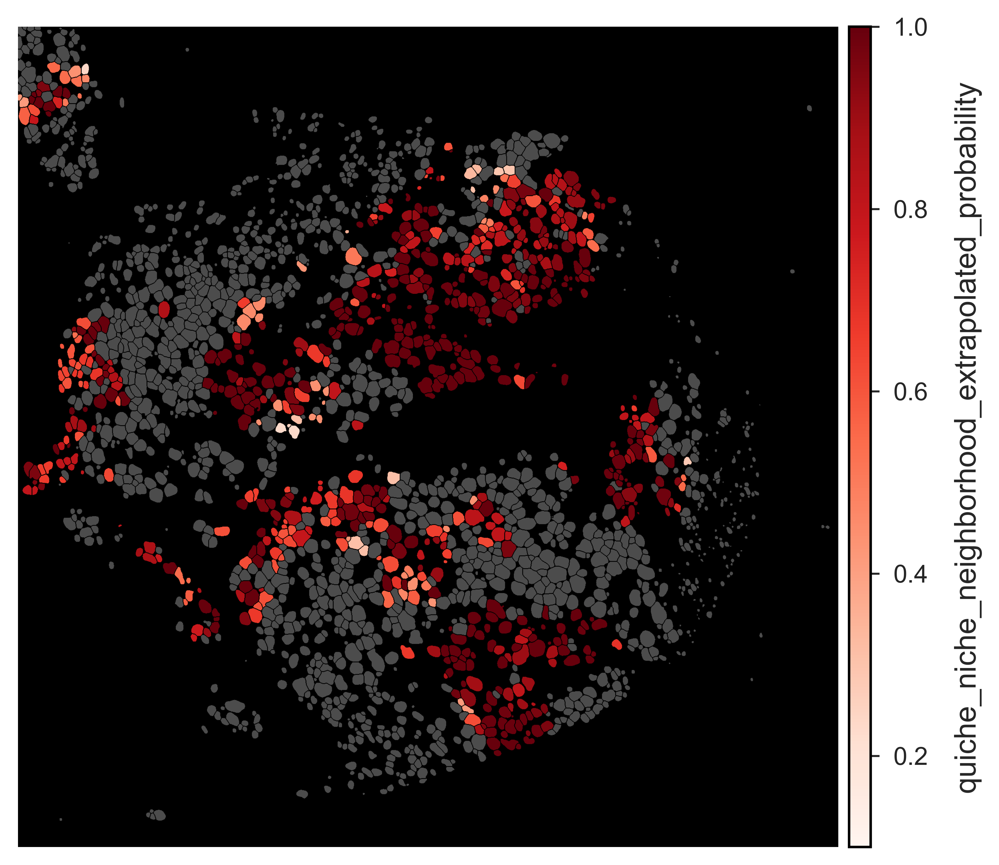

In [10]:
qu.pl.plot_niches(quiche_op, 
                  niche = niche,
                  fovs = ['TMA44_R14C7'],
                  segmentation_directory = seg_dir,
                  save_directory = os.path.join('figures', 'quiche_niche_neighborhood_extrapolated'),
                  fov_key = "fov",
                  segmentation_label_key  = "label",
                  labels_key='cell_cluster',
                  annotation_key = "quiche_niche_neighborhood_extrapolated",
                  seg_suffix = "_whole_cell.tiff",
                  colors_dict = {'Cancer_1': '#66cdaa', 'CD8T': '#ff5666'},
                  figsize = (6, 6),
                  dpi = 300)

qu.pl.plot_niche_scores(quiche_op, 
                        niche = niche,
                        fovs = ['TMA44_R14C7'],
                        segmentation_directory = seg_dir,
                        save_directory = os.path.join('figures', 'quiche_niche_neighborhood_extrapolated_probability'),
                        fov_key = "fov",
                        segmentation_label_key  = "label",
                        labels_key='cell_cluster',
                        annotation_key = "quiche_niche_neighborhood_extrapolated",
                        metric = "quiche_niche_neighborhood_extrapolated_probability",
                        seg_suffix = "_whole_cell.tiff",
                        vmin  = None,
                        vmax = None,
                        cmap = "Reds",
                        figsize = (6, 6),
                        dpi = 300)

### plot differential expression within niches as compared to the entire cohort

In [16]:
functional_markers = ['PDL1', 'Ki67', 'GLUT1', 'CD45RO', 'CD69', 'PD1', 'CD57', 'TBET', 'TCF1', 'CD45RB', 'TIM3', 'IDO', 'LAG3', 'CD38', 'HLADR']
quiche_op.compute_functional_expression(niches=niche_scores.index,
                                        annotation_key = 'quiche_niche_neighborhood', ##could change this to quiche_niche_neighborhood_extrapolated if you prefer that
                                        min_cell_threshold = 3,
                                        foldchange_key = 'logFC',
                                        markers = functional_markers,
                                        n_jobs = 8)

Computing Functional Expression:   0%|          | 0/7237 [00:00<?, ?it/s]

  0%|          | 0/7237 [00:00<?, ?it/s]

Computing Functional Expression:   0%|          | 0/7237 [00:09<?, ?it/s]


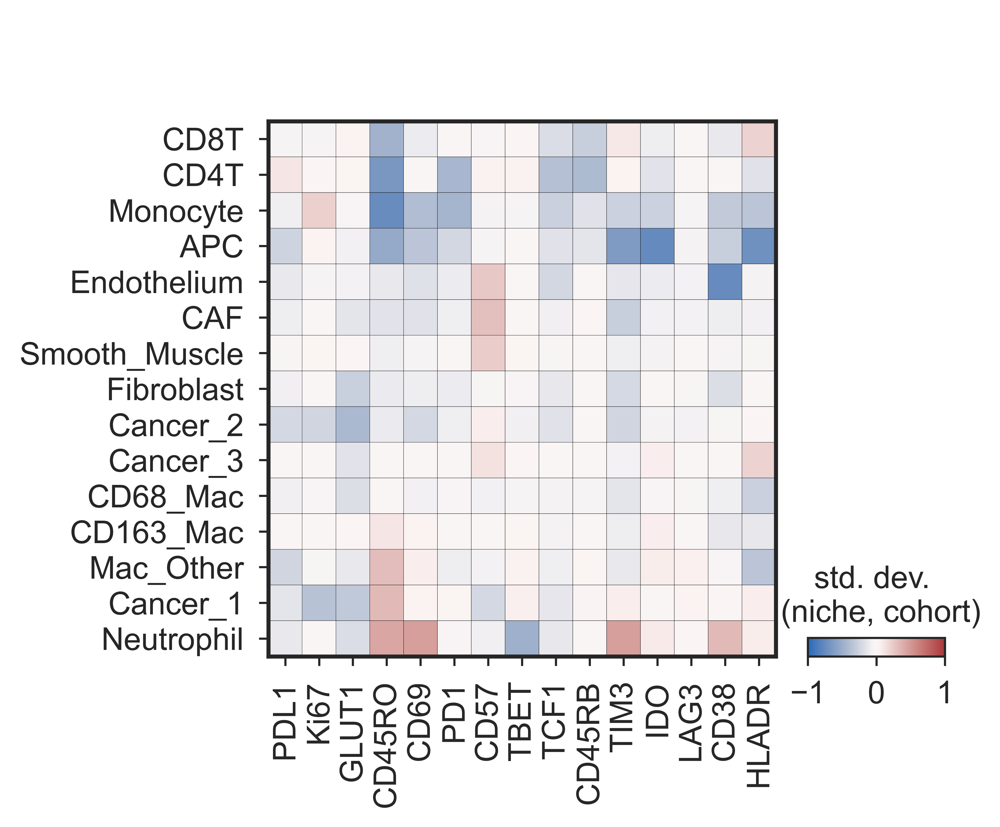

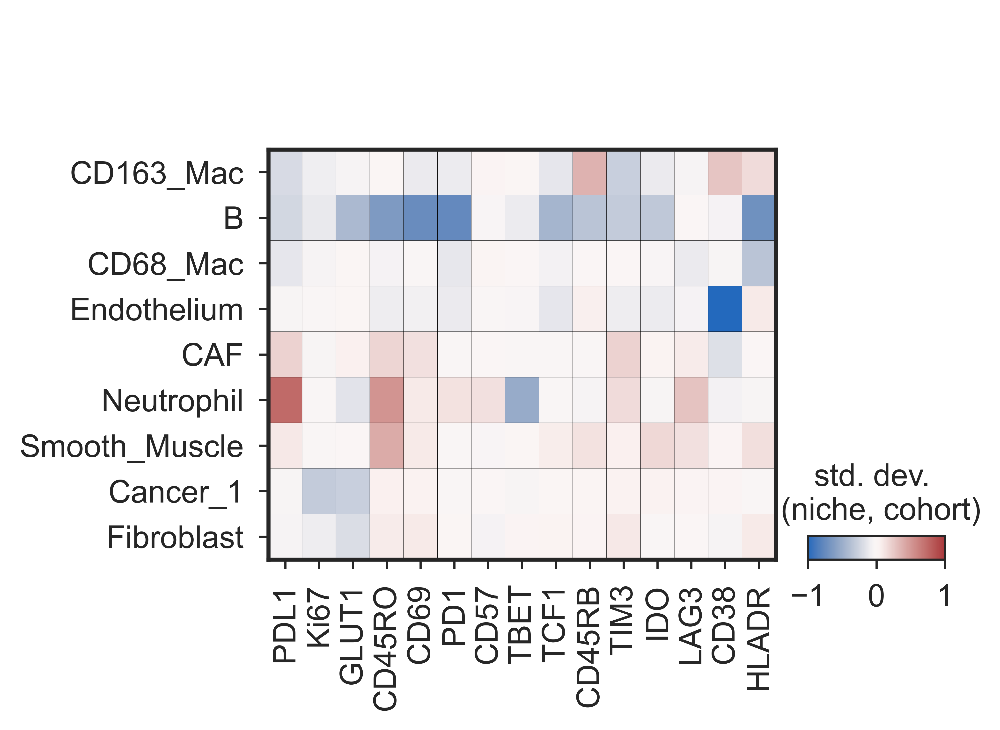

In [17]:
qu.pl.plot_differential_expression(quiche_op,
                            niches = np.unique(niche_metadata_neg.quiche_niche_neighborhood), 
                            annotation_key = 'quiche_niche_neighborhood',
                            labels_key = 'cell_cluster',
                            markers = functional_markers,
                            figsize = (5.25, 4.5),
                            cmap = 'vlag',
                            save_directory = 'figures',
                            filename_save = 'matrixplot')

qu.pl.plot_differential_expression(quiche_op,
                            niches = np.unique(niche_metadata_pos.quiche_niche_neighborhood), 
                            annotation_key = 'quiche_niche_neighborhood',
                            labels_key = 'cell_cluster',
                            markers = functional_markers,
                            figsize = (5.25, 4),
                            cmap = 'vlag',
                            vmin = -1,
                            vmax = 1,
                            vcenter = 0,
                            dendrogram = True,
                            save_directory = 'figures',
                            filename_save = 'matrixplot')